In [1]:
import pandas as pd
import os
import glob
import io 
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from scipy.stats import zscore
from brainspace.gradient import GradientMaps
from sklearn.metrics.pairwise import cosine_similarity

In [2]:
def get_gradients(matrix,side,region):

    if region!='ctx':
        matrix= cosine_similarity(matrix.T, matrix.T)

    gm = GradientMaps(n_components=4, random_state=0)
    gm.fit(matrix)

    grad_1 = gm.gradients_.T[0]
    grad_2 = gm.gradients_.T[1]
    grad_3 = gm.gradients_.T[2]
    grad_4 = gm.gradients_.T[3]

    gradient_df = pd.DataFrame({side+'_grad_1': grad_1, side+'_grad_2': grad_2, side+'_grad_3': grad_3, side+'_grad_4': grad_4})

    return gradient_df

In [4]:

import itertools
def reject_outliers_2(matrix, m=2.):

    mean_matrix = np.zeros((np.shape(matrix)[0],np.shape(matrix)[1]))
    for i, j in itertools.product(range(np.shape(matrix)[0]),range(np.shape(matrix)[1])):

        data = matrix[i,j,:]
        d = np.abs(data - np.median(data))
        mdev = np.median(d)
        s = d / (mdev if mdev else 1.)
        mean_matrix[i,j] = np.mean(data[s < m])
    return mean_matrix






In [5]:
df = pd.read_table('../participants.tsv')
subjects = df.participant_id.to_list() 
subj = [ s.strip('sub-') for s in subjects ]


def get_mean_matrix(session,side,region):
    #subj = ['3119','3120']
    matrix_dir = '/home/dimuthu1/scratch/PPMI_project2/derivatives/analysis/cortex/gradients/'+session

    matrix = np.load(matrix_dir+"/sub-"+subj[0]+"_"+side+"_"+region+".npy")

    cube_matrix = np.zeros((np.shape(matrix)[0],np.shape(matrix)[1],len(subj)))

    


    for i,subjects in enumerate(subj):
        
        matrix = np.load(matrix_dir+"/sub-"+subjects+"_"+side+"_"+region+".npy")
        cube_matrix[:,:,i]=matrix

    #mean_data = np.mean(cube_matrix, axis=2)
    mean_data = reject_outliers_2(cube_matrix, m=2.)

    return mean_data

mean_ctx_L_12 = get_mean_matrix('month12','L','sbctx')
mean_ctx_L_24 = get_mean_matrix('month24','L','sbctx')

df_ctx_L_12 = get_gradients(mean_ctx_L_12,'L','sbctx')
df_ctx_L_24 = get_gradients(mean_ctx_L_24,'L','sbctx')




In [5]:

df_ctx_L_12['month'] = 'm12'
df_ctx_L_24['month'] = 'm24'


df_ctx_all = df_ctx_L_24.append(df_ctx_L_12)

print(df_ctx_all)

      L_grad_1  L_grad_2  L_grad_3  L_grad_4 month
0    -0.133234 -0.799696  0.533898  0.063785   m24
1    -0.354935 -1.191724 -0.421778  1.428486   m24
2    -0.186789 -1.199359 -0.025125  0.959973   m24
3     2.325754  0.130643  0.113812  0.446862   m24
4    -0.470494 -1.120334 -0.452968  1.548984   m24
...        ...       ...       ...       ...   ...
1918 -0.293666  1.299227 -0.213985  0.776297   m12
1919 -0.326811  1.366503 -0.876521  1.327732   m12
1920 -0.193479  0.497117  0.273704  0.191707   m12
1921 -0.504373  1.322425 -1.077725  1.538848   m12
1922 -0.331774  0.733821  0.024392  0.301272   m12

[3846 rows x 5 columns]


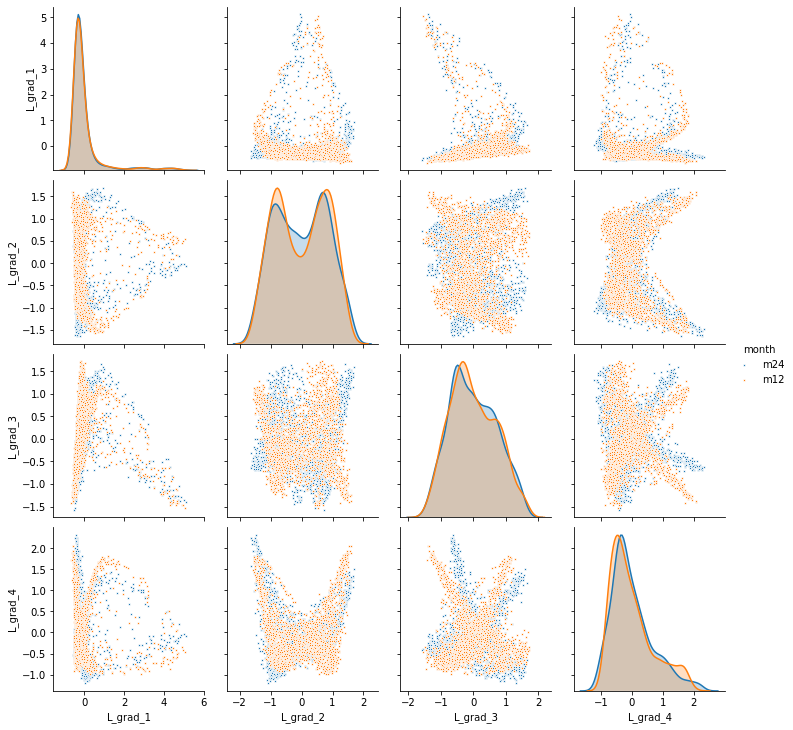

In [6]:
out_path='/home/dimuthu1/scratch/PPMI_project2/derivatives/analysis/cortex/group_analysis'
sns_plot_L = sns.pairplot(df_ctx_all,plot_kws={"s": 5}, hue="month")
sns_plot_L.savefig(out_path+"/group_stat_L.png")


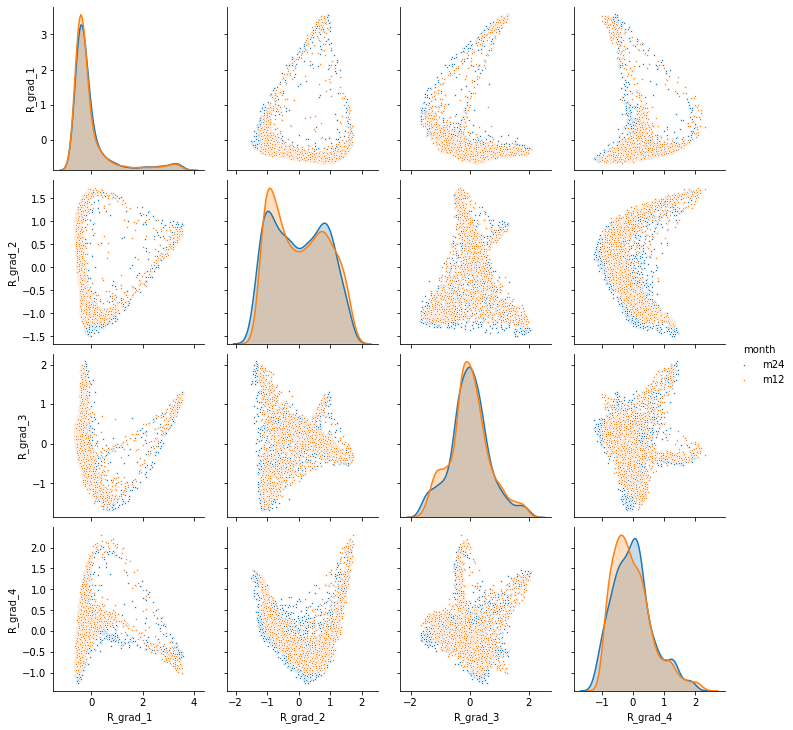

In [7]:
mean_ctx_L_12 = get_mean_matrix('month12','R','sbctx')
mean_ctx_L_24 = get_mean_matrix('month24','R','sbctx')

df_ctx_L_12 = get_gradients(mean_ctx_L_12,'R','sbctx')
df_ctx_L_24 = get_gradients(mean_ctx_L_24,'R','sbctx')


df_ctx_L_12['month'] = 'm12'
df_ctx_L_24['month'] = 'm24'


df_ctx_all = df_ctx_L_24.append(df_ctx_L_12)

out_path='/home/dimuthu1/scratch/PPMI_project2/derivatives/analysis/cortex/group_analysis'
sns_plot_L = sns.pairplot(df_ctx_all,plot_kws={"s": 5}, hue="month")
sns_plot_L.savefig(out_path+"/group_stat_R.png")

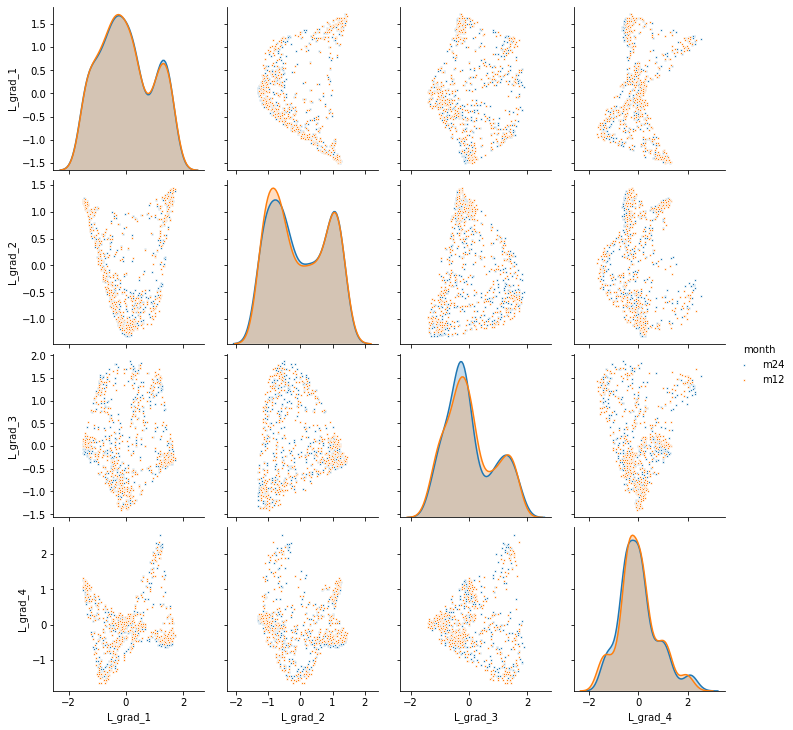

In [8]:
mean_ctx_L_12 = get_mean_matrix('month12','L','ctx')
mean_ctx_L_24 = get_mean_matrix('month24','L','ctx')

df_ctx_L_12 = get_gradients(mean_ctx_L_12,'L','ctx')
df_ctx_L_24 = get_gradients(mean_ctx_L_24,'L','ctx')


df_ctx_L_12['month'] = 'm12'
df_ctx_L_24['month'] = 'm24'


df_ctx_all = df_ctx_L_24.append(df_ctx_L_12)

out_path='/home/dimuthu1/scratch/PPMI_project2/derivatives/analysis/cortex/group_analysis'
sns_plot_L = sns.pairplot(df_ctx_all,plot_kws={"s": 5}, hue="month")
sns_plot_L.savefig(out_path+"/group_stat_L_ctx.png")

[[ 1.          0.62102291  0.49739461 ...  0.16713091 -0.00879867
   0.05395084]
 [ 0.62102291  1.          0.38104601 ...  0.23437941  0.00701991
   0.0488659 ]
 [ 0.49739461  0.38104601  1.         ...  0.20827749  0.08779927
   0.16026208]
 ...
 [ 0.16713091  0.23437941  0.20827749 ...  1.          0.27653649
   0.40065211]
 [-0.00879867  0.00701991  0.08779927 ...  0.27653649  1.
   0.59946708]
 [ 0.05395084  0.0488659   0.16026208 ...  0.40065211  0.59946708
   1.        ]]
[[ 1.          0.62860285  0.51403541 ...  0.15777122 -0.01850131
   0.04297943]
 [ 0.62860285  1.          0.397392   ...  0.23148148  0.00897641
   0.04886859]
 [ 0.51403541  0.397392    1.         ...  0.18624468  0.07542231
   0.13999538]
 ...
 [ 0.15777122  0.23148148  0.18624468 ...  1.          0.2799765
   0.40405298]
 [-0.01850131  0.00897641  0.07542231 ...  0.2799765   1.
   0.58943389]
 [ 0.04297943  0.04886859  0.13999538 ...  0.40405298  0.58943389
   1.        ]]
     R_grad_1  R_grad_2  R_grad_3

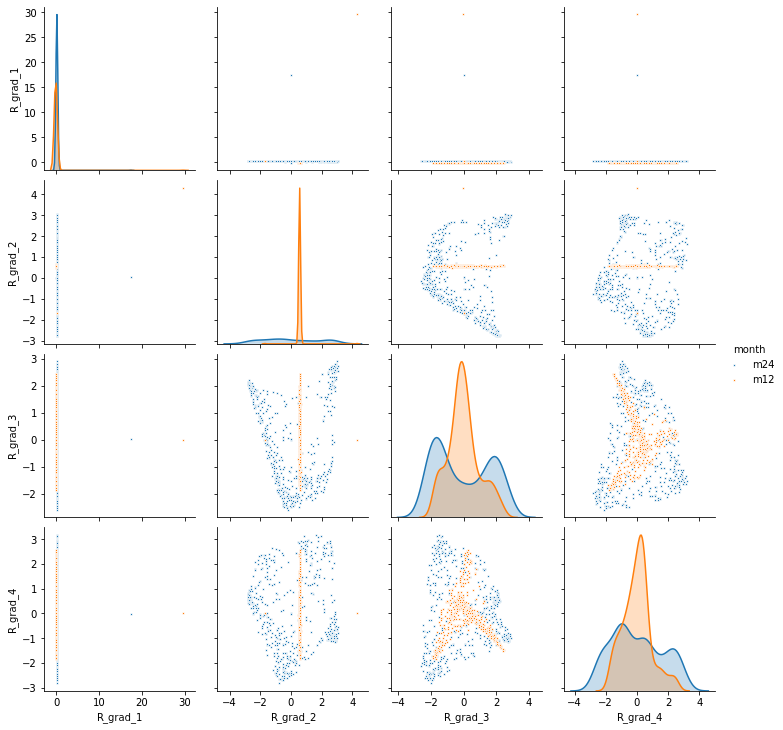

In [38]:
mean_ctx_L_12 = get_mean_matrix('month12','R','ctx')
mean_ctx_L_24 = get_mean_matrix('month24','R','ctx')



print(mean_ctx_L_12)
mean_ctx_L_12[mean_ctx_L_12<0]= 0.6
#plt.imshow(mean_ctx_L_12)
#plt.show()
print(mean_ctx_L_24)
#print(mean_ctx_L_24)
#plt.imshow(mean_ctx_L_24)
#plt.show()

df_ctx_L_12 = get_gradients(mean_ctx_L_12,'R','ctx')
df_ctx_L_24 = get_gradients(mean_ctx_L_24,'R','ctx')



print(df_ctx_L_12)
print(df_ctx_L_24)

df_ctx_L_12['month'] = 'm12'
df_ctx_L_24['month'] = 'm24'


df_ctx_all = df_ctx_L_24.append(df_ctx_L_12)

print(df_ctx_all)

out_path='/home/dimuthu1/scratch/PPMI_project2/derivatives/analysis/cortex/group_analysis'
sns_plot_L = sns.pairplot(df_ctx_all,plot_kws={"s": 5}, hue="month")
sns_plot_L.savefig(out_path+"/group_stat_R_ctx.png")